<a href="https://colab.research.google.com/github/snowshine/NFTCreators/blob/main/gan/nftcreator.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Setup

### Google Drive Setup
for running on Google Colab only

In [2]:
from google.colab import drive
# drive.flush_and_unmount()
drive.mount('/content/gdrive', force_remount=True)

import sys
sys.path.append('/content/gdrive/MyDrive/capstone/gan/')

# change working directory to this notebook location
%cd /content/gdrive/MyDrive/capstone/gan
!ls -art

Mounted at /content/gdrive
/content/gdrive/MyDrive/capstone/gan
ganevaluation.py  imagedata.py	dcgan.py  __pycache__  nftcreator.ipynb


In [2]:
# drive.flush_and_unmount()

### Imports and Computing Environment
- Included modules are in the same directory of this notebook
- Tensorflow version 2.8.0
- At least one GPU required

In [3]:
from dcgan import *
from imagedata import *
from ganevaluation import *

import tensorflow as tf
import psutil
print('Num of CPUs:', psutil.cpu_count(), "; Num of GPUs:", len(tf.config.list_physical_devices('GPU')))
print("total memory:", '{:0,.0f}'.format(psutil.virtual_memory().total), "; memory available:", '{:0,.0f}'.format(psutil.virtual_memory().available))

print('TF version:', tf.__version__, '; GPU name:', tf.test.gpu_device_name())

Num of CPUs: 4 ; Num of GPUs: 1
total memory: 27,337,134,080 ; memory available: 26,002,640,896
TF version: 2.8.0 ; GPU name: /device:GPU:0


### Setup Parameters


In [6]:
# source data parameters
# source file: <datapath>/<collection>.<datatype>
collection = "doodles"
datapath = '../data/'
outputpath = '../output/'
datatype = 'npz'  # npz, zip, or img

# image resolution and channel, 128 is the highest for CoLab (with GPU)
# support (128, 128, 3) and (32, 32, 3)
image_shape = (128, 128, 3)  

# adjust depending on size of the dataset, image resolution and computing enviornment
# tried 16, 32, 64, 128, 256, 1024
# for Colab: 128 works best for (128,128,3). 256 may work, but OOM for 20k RGB 128 collections
# smaller batch size has better performance for (32,32,3). i.e. 16(cryptopunks32), 32(hapeprime32)
batch_size = 128

# training parameters
startepoch = 406  # 0:initial training, others: continue
epochs = 1000  # how many epochs to run

### Loading Data

In [7]:
imgdata = imagedata(collection, datapath)
train_dataset = imgdata.load_dataset(datatype, batch_size, image_shape)

## Model Training

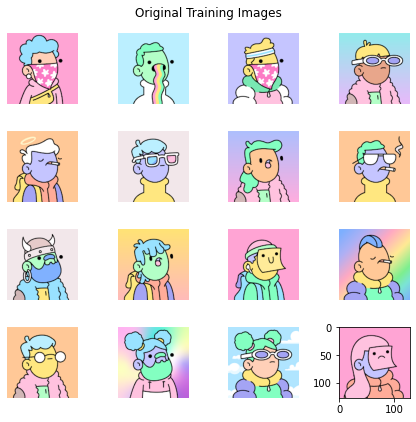

/content/gdrive/MyDrive/capstone/gan/dcgan.py:436: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  fig.add_subplot(grid_size, grid_size, 1 + i) #(ROW,COLUMN,POSITION)


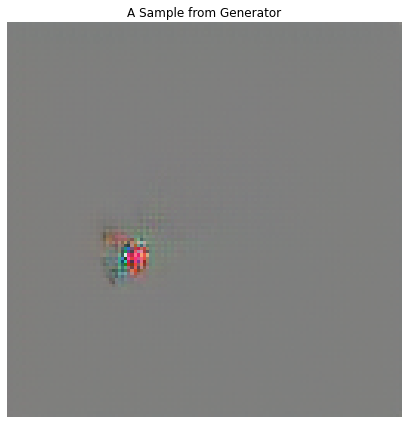

In [8]:
gan = dcgan(collection, outputpath, startepoch, image_shape)
gan.view_orig_images(train_dataset)

if startepoch > 0:
    gan.view_generated_sample()

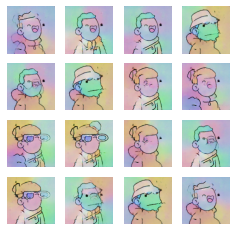

Epoch 256, generator_loss=8.510491371154785,discriminator_loss=0.32243746519088745, run_time=0:00:52.42


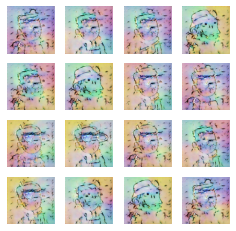

Epoch 257, generator_loss=7.897894382476807,discriminator_loss=0.3863920569419861, run_time=0:00:45.57


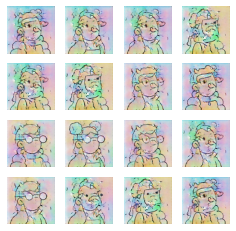

Epoch 258, generator_loss=5.61339807510376,discriminator_loss=0.3326629102230072, run_time=0:00:45.61


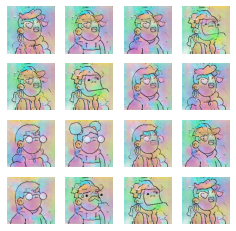

Epoch 259, generator_loss=6.57055139541626,discriminator_loss=0.3272087275981903, run_time=0:00:45.61


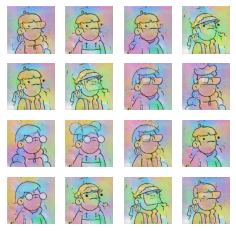

Epoch 260, generator_loss=6.793436527252197,discriminator_loss=0.3278859555721283, run_time=0:00:45.86


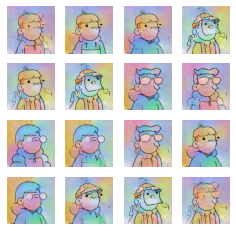

Epoch 261, generator_loss=7.303810119628906,discriminator_loss=0.3256392776966095, run_time=0:00:45.64


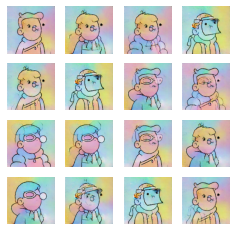

Epoch 262, generator_loss=6.856932163238525,discriminator_loss=0.3270174562931061, run_time=0:00:45.57


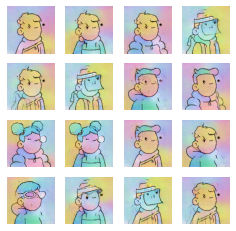

Epoch 263, generator_loss=7.655477523803711,discriminator_loss=0.32923200726509094, run_time=0:00:45.59


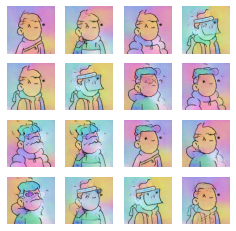

Epoch 264, generator_loss=7.496654033660889,discriminator_loss=0.3235742747783661, run_time=0:00:45.91


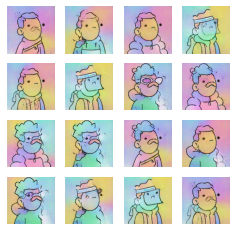

Epoch 265, generator_loss=7.340073585510254,discriminator_loss=0.3242202401161194, run_time=0:00:45.02


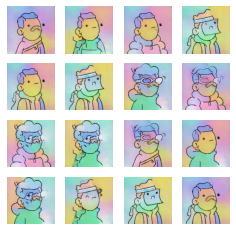

Epoch 266, generator_loss=7.922453880310059,discriminator_loss=0.32229018211364746, run_time=0:00:45.01


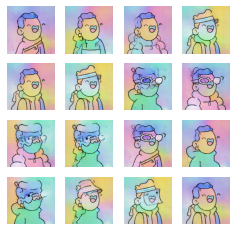

Epoch 267, generator_loss=7.745100021362305,discriminator_loss=0.3227912485599518, run_time=0:00:45.02


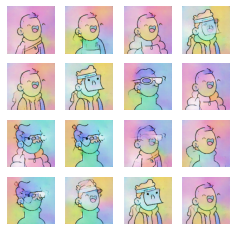

Epoch 268, generator_loss=7.925105094909668,discriminator_loss=0.32171523571014404, run_time=0:00:45.02


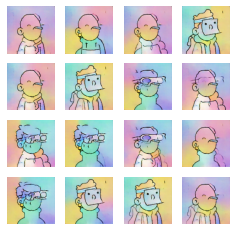

Epoch 269, generator_loss=7.867472171783447,discriminator_loss=0.32257863879203796, run_time=0:00:45.29
INFO:tensorflow:Assets written to: ../output/doodles/generator270/assets
INFO:tensorflow:Assets written to: ../output/doodles/discriminator270/assets
INFO:tensorflow:Assets written to: ../output/doodles/generator/assets
INFO:tensorflow:Assets written to: ../output/doodles/discriminator/assets


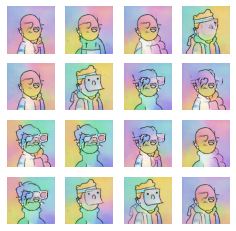

Epoch 270, generator_loss=8.036109924316406,discriminator_loss=0.3213113844394684, run_time=0:00:57.96


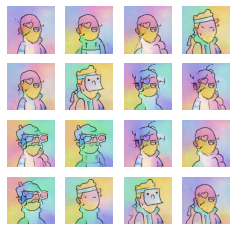

Epoch 271, generator_loss=8.294763565063477,discriminator_loss=0.3207840919494629, run_time=0:00:45.08


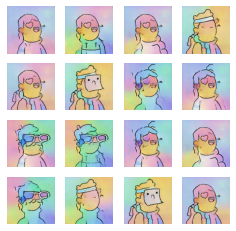

Epoch 272, generator_loss=8.394193649291992,discriminator_loss=0.3200657367706299, run_time=0:00:45.35


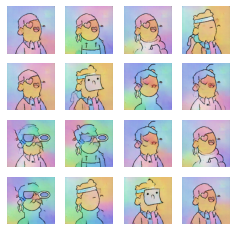

Epoch 273, generator_loss=8.304410934448242,discriminator_loss=0.320547491312027, run_time=0:00:45.05


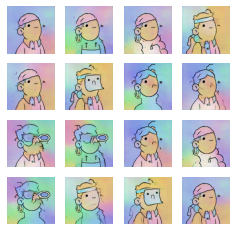

Epoch 274, generator_loss=8.344563484191895,discriminator_loss=0.32113584876060486, run_time=0:00:45.04


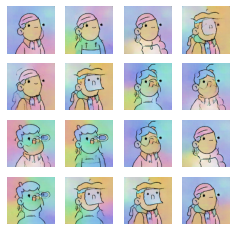

Epoch 275, generator_loss=8.344512939453125,discriminator_loss=0.31995731592178345, run_time=0:00:44.99


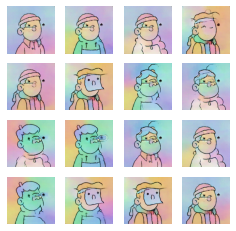

Epoch 276, generator_loss=8.521319389343262,discriminator_loss=0.3215128481388092, run_time=0:00:45.01


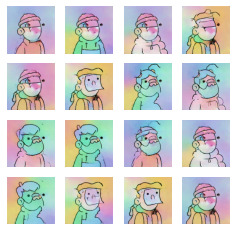

Epoch 277, generator_loss=8.362833976745605,discriminator_loss=0.3201057016849518, run_time=0:00:45.32


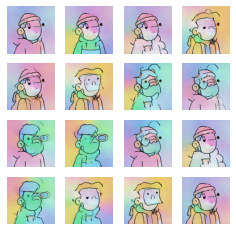

Epoch 278, generator_loss=8.39349365234375,discriminator_loss=0.3206317722797394, run_time=0:00:45.01


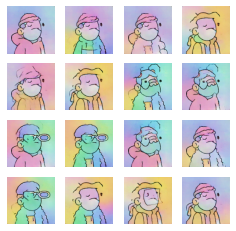

Epoch 279, generator_loss=8.13747501373291,discriminator_loss=0.32122883200645447, run_time=0:00:45.02


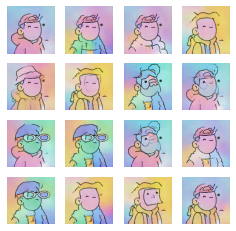

Epoch 280, generator_loss=8.410713195800781,discriminator_loss=0.32031163573265076, run_time=0:00:45.03


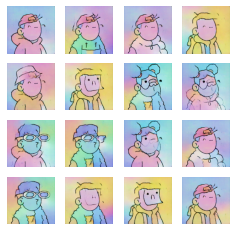

Epoch 281, generator_loss=8.680646896362305,discriminator_loss=0.32056161761283875, run_time=0:00:45.27


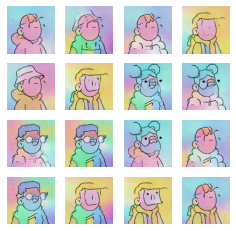

Epoch 282, generator_loss=8.368749618530273,discriminator_loss=0.32059499621391296, run_time=0:00:45.03


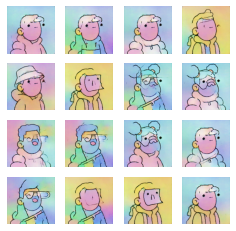

Epoch 283, generator_loss=8.234094619750977,discriminator_loss=0.3220626413822174, run_time=0:00:44.97


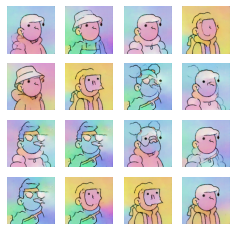

Epoch 284, generator_loss=8.547404289245605,discriminator_loss=0.32067209482192993, run_time=0:00:45.03
INFO:tensorflow:Assets written to: ../output/doodles/generator285/assets
INFO:tensorflow:Assets written to: ../output/doodles/discriminator285/assets
INFO:tensorflow:Assets written to: ../output/doodles/generator/assets
INFO:tensorflow:Assets written to: ../output/doodles/discriminator/assets


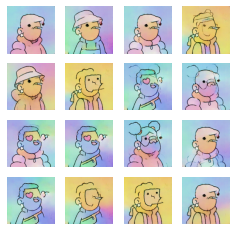

Epoch 285, generator_loss=8.561786651611328,discriminator_loss=0.3203865885734558, run_time=0:00:57.76


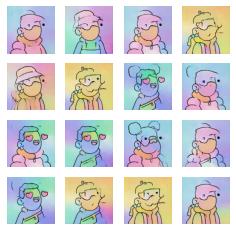

Epoch 286, generator_loss=8.753266334533691,discriminator_loss=0.3201211392879486, run_time=0:00:45.36


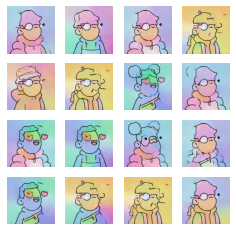

Epoch 287, generator_loss=8.723310470581055,discriminator_loss=0.32021570205688477, run_time=0:00:45.08


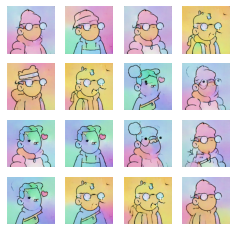

Epoch 288, generator_loss=8.743844032287598,discriminator_loss=0.3197861313819885, run_time=0:00:45.00


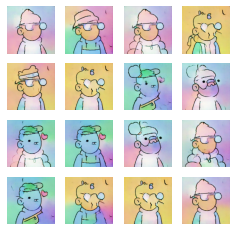

Epoch 289, generator_loss=8.742178916931152,discriminator_loss=0.31968727707862854, run_time=0:00:45.02


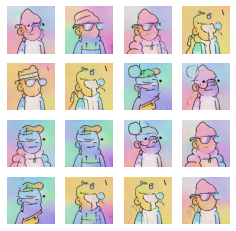

Epoch 290, generator_loss=8.995012283325195,discriminator_loss=0.31990760564804077, run_time=0:00:45.30


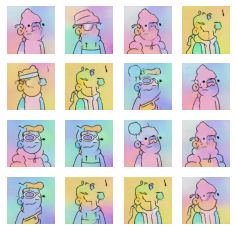

Epoch 291, generator_loss=8.906071662902832,discriminator_loss=0.31946834921836853, run_time=0:00:45.02


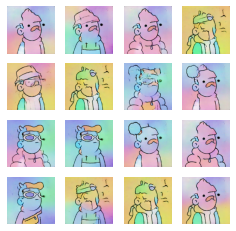

Epoch 292, generator_loss=8.894189834594727,discriminator_loss=0.31986188888549805, run_time=0:00:45.01


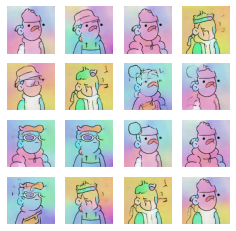

Epoch 293, generator_loss=9.249814987182617,discriminator_loss=0.31916600465774536, run_time=0:00:44.98


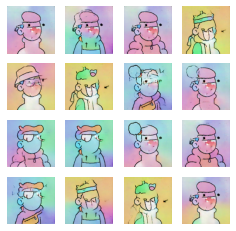

Epoch 294, generator_loss=8.846131324768066,discriminator_loss=0.31922000646591187, run_time=0:00:45.01


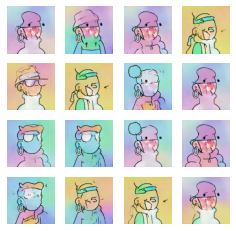

Epoch 295, generator_loss=8.826735496520996,discriminator_loss=0.3196335434913635, run_time=0:00:45.26


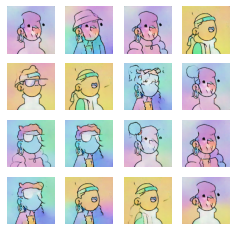

Epoch 296, generator_loss=9.14481258392334,discriminator_loss=0.3194276988506317, run_time=0:00:45.04


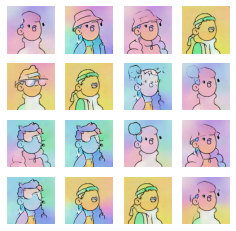

Epoch 297, generator_loss=9.10417366027832,discriminator_loss=0.31922146677970886, run_time=0:00:45.00


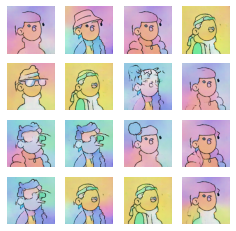

Epoch 298, generator_loss=9.38105297088623,discriminator_loss=0.31871968507766724, run_time=0:00:44.98


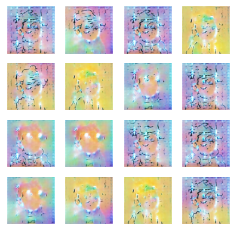

Epoch 299, generator_loss=8.189385414123535,discriminator_loss=0.4533708095550537, run_time=0:00:45.27
INFO:tensorflow:Assets written to: ../output/doodles/generator300/assets
INFO:tensorflow:Assets written to: ../output/doodles/discriminator300/assets
INFO:tensorflow:Assets written to: ../output/doodles/generator/assets
INFO:tensorflow:Assets written to: ../output/doodles/discriminator/assets


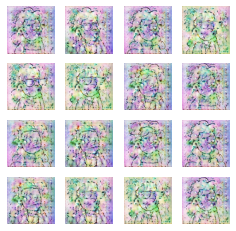

Epoch 300, generator_loss=5.072946548461914,discriminator_loss=0.34007513523101807, run_time=0:00:57.77


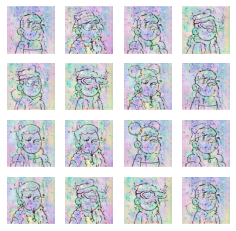

Epoch 301, generator_loss=5.603738307952881,discriminator_loss=0.34921035170555115, run_time=0:00:45.02


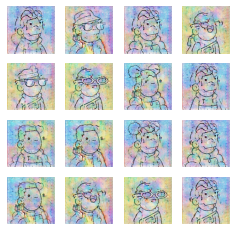

Epoch 302, generator_loss=6.023617267608643,discriminator_loss=0.35321974754333496, run_time=0:00:45.04


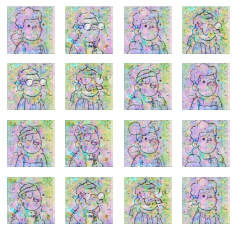

Epoch 303, generator_loss=5.073848247528076,discriminator_loss=0.3957999348640442, run_time=0:00:44.97


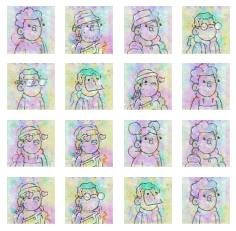

Epoch 304, generator_loss=6.0077691078186035,discriminator_loss=0.3449108302593231, run_time=0:00:45.26


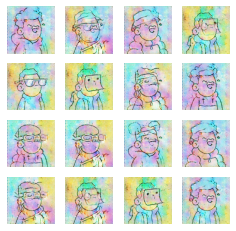

Epoch 305, generator_loss=6.1708760261535645,discriminator_loss=0.336372047662735, run_time=0:00:45.01


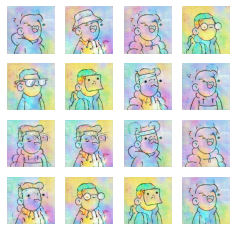

Epoch 306, generator_loss=6.510567665100098,discriminator_loss=0.33982133865356445, run_time=0:00:44.99


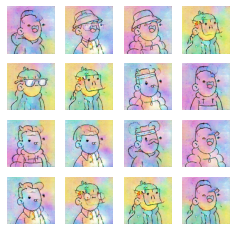

Epoch 307, generator_loss=6.452822685241699,discriminator_loss=0.3346478044986725, run_time=0:00:44.97


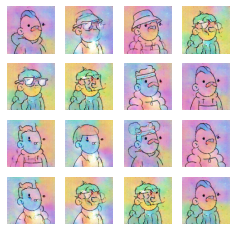

Epoch 308, generator_loss=6.615523815155029,discriminator_loss=0.3311607539653778, run_time=0:00:45.03


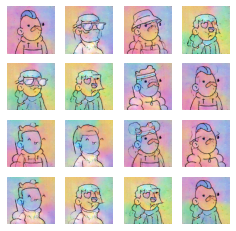

Epoch 309, generator_loss=6.848679542541504,discriminator_loss=0.32903972268104553, run_time=0:00:45.23


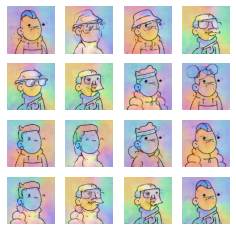

Epoch 310, generator_loss=7.010218620300293,discriminator_loss=0.33094924688339233, run_time=0:00:44.96


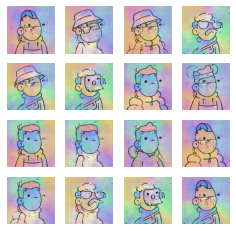

Epoch 311, generator_loss=7.233233451843262,discriminator_loss=0.3294941484928131, run_time=0:00:45.02


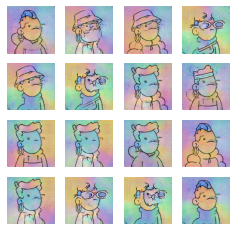

Epoch 312, generator_loss=6.984161376953125,discriminator_loss=0.32644277811050415, run_time=0:00:45.03


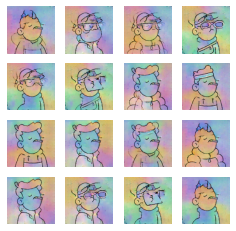

Epoch 313, generator_loss=7.210272312164307,discriminator_loss=0.32520413398742676, run_time=0:00:45.24


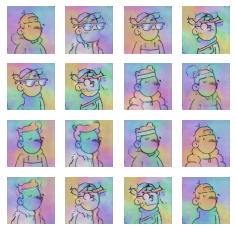

Epoch 314, generator_loss=7.821834564208984,discriminator_loss=0.3259493410587311, run_time=0:00:45.04
INFO:tensorflow:Assets written to: ../output/doodles/generator315/assets
INFO:tensorflow:Assets written to: ../output/doodles/discriminator315/assets
INFO:tensorflow:Assets written to: ../output/doodles/generator/assets
INFO:tensorflow:Assets written to: ../output/doodles/discriminator/assets


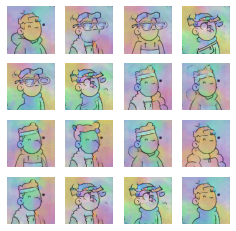

Epoch 315, generator_loss=7.303946495056152,discriminator_loss=0.3246212303638458, run_time=0:00:57.80


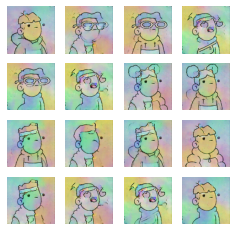

Epoch 316, generator_loss=7.530951023101807,discriminator_loss=0.3240422010421753, run_time=0:00:45.05


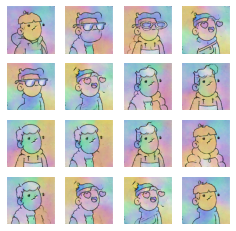

Epoch 317, generator_loss=7.23196268081665,discriminator_loss=0.3256819546222687, run_time=0:00:45.28


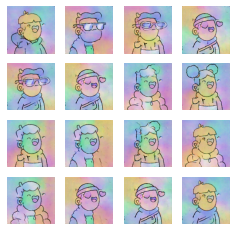

Epoch 318, generator_loss=7.555165767669678,discriminator_loss=0.3244265913963318, run_time=0:00:45.06


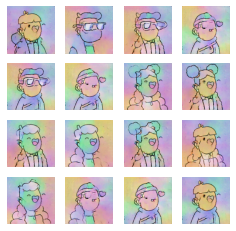

Epoch 319, generator_loss=7.686136722564697,discriminator_loss=0.32400569319725037, run_time=0:00:45.08


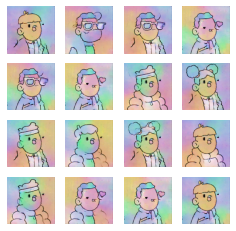

Epoch 320, generator_loss=7.297508716583252,discriminator_loss=0.3240105211734772, run_time=0:00:45.01


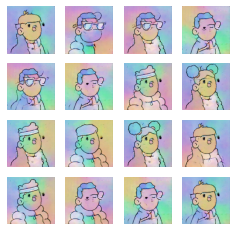

Epoch 321, generator_loss=7.875907897949219,discriminator_loss=0.3231322765350342, run_time=0:00:45.01


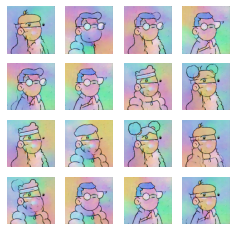

Epoch 322, generator_loss=7.84776496887207,discriminator_loss=0.3219304084777832, run_time=0:00:45.32


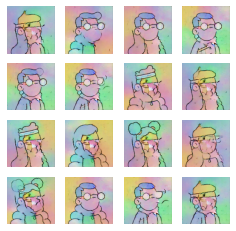

Epoch 323, generator_loss=8.198034286499023,discriminator_loss=0.32227739691734314, run_time=0:00:45.04


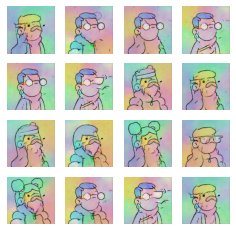

Epoch 324, generator_loss=8.161317825317383,discriminator_loss=0.32121285796165466, run_time=0:00:45.07


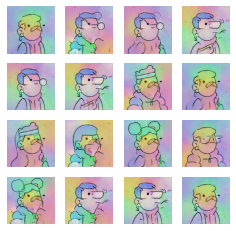

Epoch 325, generator_loss=8.30607795715332,discriminator_loss=0.3209192454814911, run_time=0:00:45.02


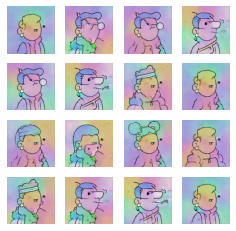

Epoch 326, generator_loss=8.17359447479248,discriminator_loss=0.3215394914150238, run_time=0:00:45.31


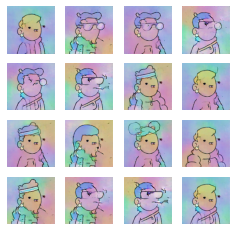

Epoch 327, generator_loss=8.51815128326416,discriminator_loss=0.3202204704284668, run_time=0:00:45.05


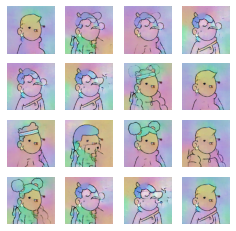

Epoch 328, generator_loss=8.485183715820312,discriminator_loss=0.32060521841049194, run_time=0:00:45.06


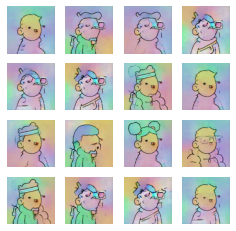

Epoch 329, generator_loss=8.650786399841309,discriminator_loss=0.3205545246601105, run_time=0:00:45.03
INFO:tensorflow:Assets written to: ../output/doodles/generator330/assets
INFO:tensorflow:Assets written to: ../output/doodles/discriminator330/assets
INFO:tensorflow:Assets written to: ../output/doodles/generator/assets
INFO:tensorflow:Assets written to: ../output/doodles/discriminator/assets


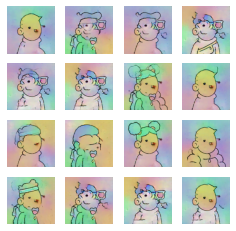

Epoch 330, generator_loss=8.726639747619629,discriminator_loss=0.32048696279525757, run_time=0:00:58.04


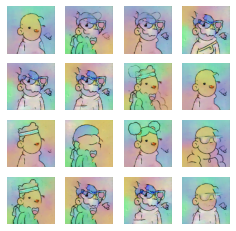

Epoch 331, generator_loss=8.987860679626465,discriminator_loss=0.319706529378891, run_time=0:00:45.12


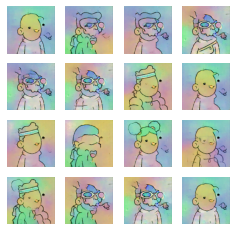

Epoch 332, generator_loss=8.868497848510742,discriminator_loss=0.31954139471054077, run_time=0:00:45.06


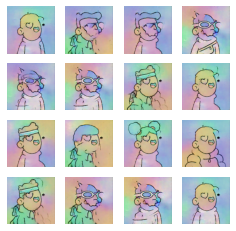

Epoch 333, generator_loss=8.361306190490723,discriminator_loss=0.32024145126342773, run_time=0:00:45.02


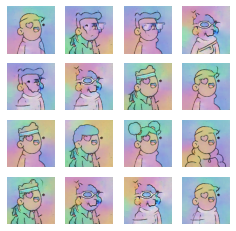

Epoch 334, generator_loss=8.68007755279541,discriminator_loss=0.3198665380477905, run_time=0:00:45.04


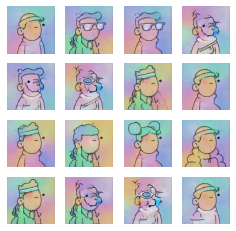

Epoch 335, generator_loss=8.692112922668457,discriminator_loss=0.3199024796485901, run_time=0:00:45.35


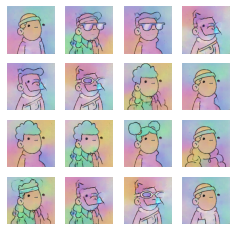

Epoch 336, generator_loss=8.394219398498535,discriminator_loss=0.3200652301311493, run_time=0:00:45.05


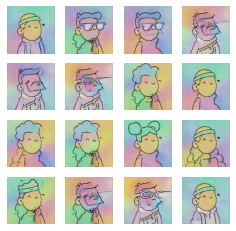

Epoch 337, generator_loss=8.533268928527832,discriminator_loss=0.32061582803726196, run_time=0:00:45.07


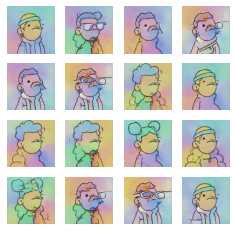

Epoch 338, generator_loss=8.529949188232422,discriminator_loss=0.3209272623062134, run_time=0:00:45.03


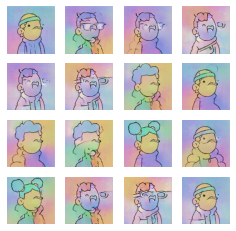

Epoch 339, generator_loss=9.015379905700684,discriminator_loss=0.32044634222984314, run_time=0:00:45.02


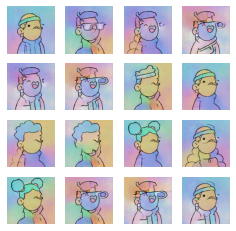

Epoch 340, generator_loss=8.580153465270996,discriminator_loss=0.3206929862499237, run_time=0:00:45.29


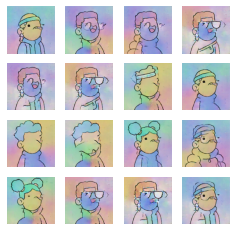

Epoch 341, generator_loss=8.783968925476074,discriminator_loss=0.31985050439834595, run_time=0:00:45.05


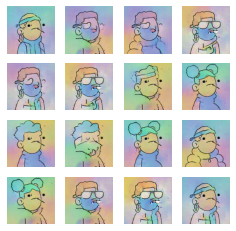

Epoch 342, generator_loss=8.671618461608887,discriminator_loss=0.3198123872280121, run_time=0:00:45.03


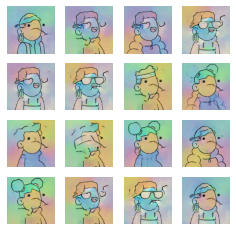

Epoch 343, generator_loss=8.765459060668945,discriminator_loss=0.3196832537651062, run_time=0:00:45.03


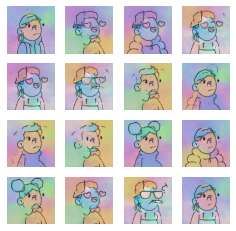

Epoch 344, generator_loss=8.743660926818848,discriminator_loss=0.32014206051826477, run_time=0:00:45.29
INFO:tensorflow:Assets written to: ../output/doodles/generator345/assets
INFO:tensorflow:Assets written to: ../output/doodles/discriminator345/assets
INFO:tensorflow:Assets written to: ../output/doodles/generator/assets
INFO:tensorflow:Assets written to: ../output/doodles/discriminator/assets


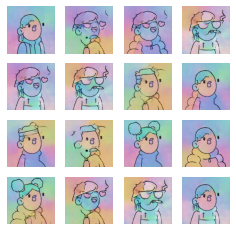

Epoch 345, generator_loss=8.823599815368652,discriminator_loss=0.320311039686203, run_time=0:00:57.89


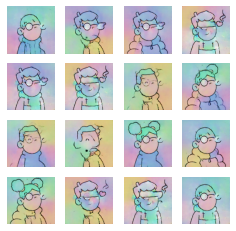

Epoch 346, generator_loss=8.598888397216797,discriminator_loss=0.3212364614009857, run_time=0:00:45.08


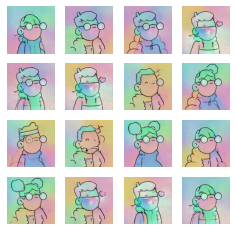

Epoch 347, generator_loss=8.699064254760742,discriminator_loss=0.31953269243240356, run_time=0:00:45.07


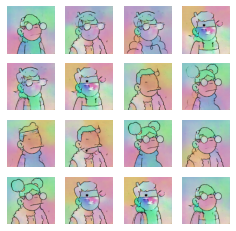

Epoch 348, generator_loss=9.052695274353027,discriminator_loss=0.3194235861301422, run_time=0:00:45.32


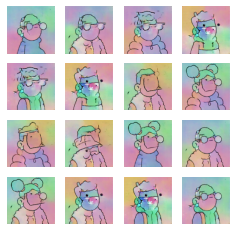

Epoch 349, generator_loss=9.283014297485352,discriminator_loss=0.3192942142486572, run_time=0:00:45.05


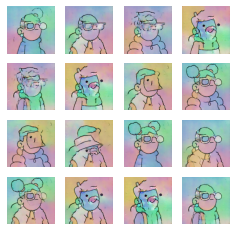

Epoch 350, generator_loss=9.006856918334961,discriminator_loss=0.31983664631843567, run_time=0:00:45.04


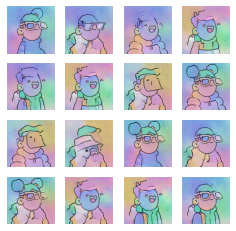

Epoch 351, generator_loss=8.935872077941895,discriminator_loss=0.3197278082370758, run_time=0:00:45.10


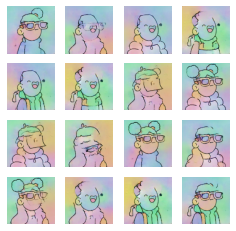

Epoch 352, generator_loss=9.098474502563477,discriminator_loss=0.32015717029571533, run_time=0:00:45.06


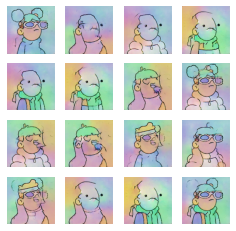

Epoch 353, generator_loss=8.689910888671875,discriminator_loss=0.3199198544025421, run_time=0:00:45.30


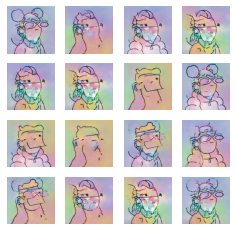

Epoch 354, generator_loss=7.857285499572754,discriminator_loss=0.32335135340690613, run_time=0:00:45.03


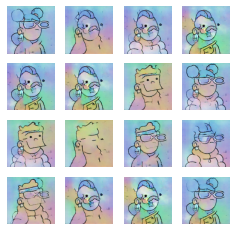

Epoch 355, generator_loss=8.505228996276855,discriminator_loss=0.32005515694618225, run_time=0:00:45.01


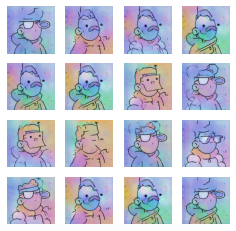

Epoch 356, generator_loss=8.85768985748291,discriminator_loss=0.3191954791545868, run_time=0:00:45.06


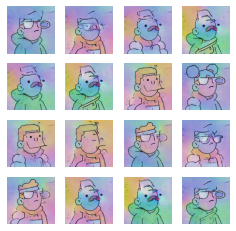

Epoch 357, generator_loss=8.80244255065918,discriminator_loss=0.3195244371891022, run_time=0:00:45.30


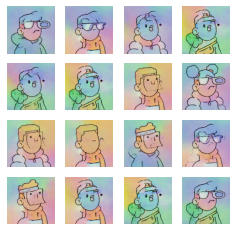

Epoch 358, generator_loss=8.92641544342041,discriminator_loss=0.31943708658218384, run_time=0:00:45.06


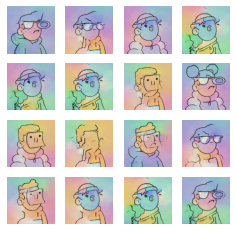

Epoch 359, generator_loss=8.942777633666992,discriminator_loss=0.3195677697658539, run_time=0:00:45.05
INFO:tensorflow:Assets written to: ../output/doodles/generator360/assets
INFO:tensorflow:Assets written to: ../output/doodles/discriminator360/assets
INFO:tensorflow:Assets written to: ../output/doodles/generator/assets
INFO:tensorflow:Assets written to: ../output/doodles/discriminator/assets


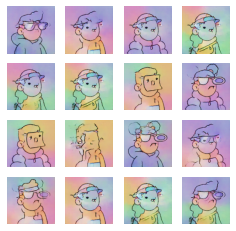

Epoch 360, generator_loss=8.868578910827637,discriminator_loss=0.31886106729507446, run_time=0:00:57.86


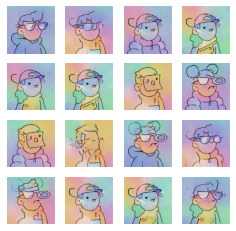

Epoch 361, generator_loss=9.154011726379395,discriminator_loss=0.31911686062812805, run_time=0:00:45.09


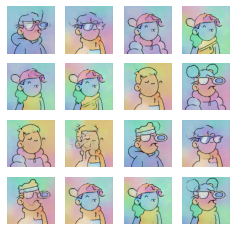

Epoch 362, generator_loss=9.236811637878418,discriminator_loss=0.318885862827301, run_time=0:00:45.34


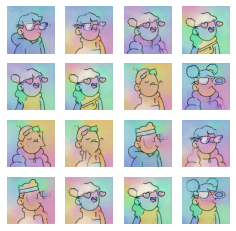

Epoch 363, generator_loss=8.978813171386719,discriminator_loss=0.31911519169807434, run_time=0:00:45.05


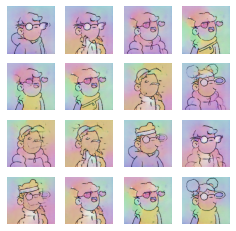

Epoch 364, generator_loss=8.968432426452637,discriminator_loss=0.3196212947368622, run_time=0:00:45.04


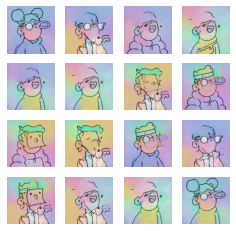

Epoch 365, generator_loss=8.72765064239502,discriminator_loss=0.3194107711315155, run_time=0:00:45.04


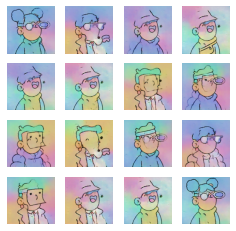

Epoch 366, generator_loss=9.374601364135742,discriminator_loss=0.31935209035873413, run_time=0:00:45.27


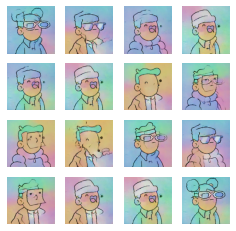

Epoch 367, generator_loss=9.08065414428711,discriminator_loss=0.31956854462623596, run_time=0:00:45.03


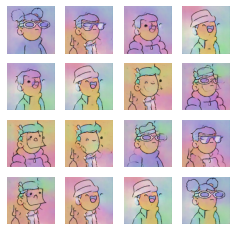

Epoch 368, generator_loss=9.702241897583008,discriminator_loss=0.32025617361068726, run_time=0:00:45.08


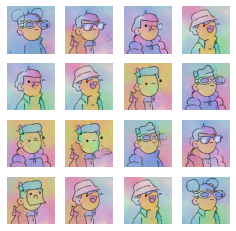

Epoch 369, generator_loss=9.418794631958008,discriminator_loss=0.31895262002944946, run_time=0:00:45.04


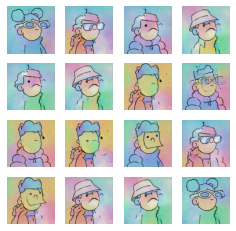

Epoch 370, generator_loss=9.70456314086914,discriminator_loss=0.31859952211380005, run_time=0:00:45.30


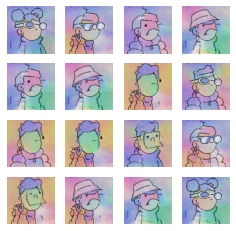

Epoch 371, generator_loss=9.63127326965332,discriminator_loss=0.31845808029174805, run_time=0:00:45.05


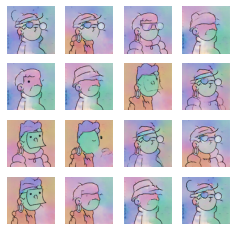

Epoch 372, generator_loss=9.596896171569824,discriminator_loss=0.31879308819770813, run_time=0:00:45.02


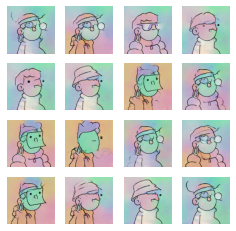

Epoch 373, generator_loss=9.897612571716309,discriminator_loss=0.31858164072036743, run_time=0:00:45.02


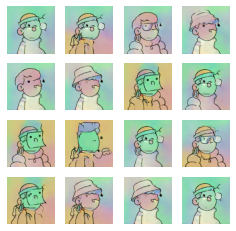

Epoch 374, generator_loss=9.819573402404785,discriminator_loss=0.31835418939590454, run_time=0:00:45.02
INFO:tensorflow:Assets written to: ../output/doodles/generator375/assets
INFO:tensorflow:Assets written to: ../output/doodles/discriminator375/assets
INFO:tensorflow:Assets written to: ../output/doodles/generator/assets
INFO:tensorflow:Assets written to: ../output/doodles/discriminator/assets


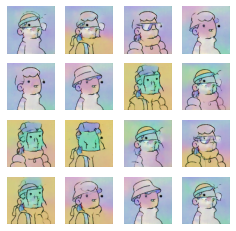

Epoch 375, generator_loss=9.517702102661133,discriminator_loss=0.31864598393440247, run_time=0:00:58.07


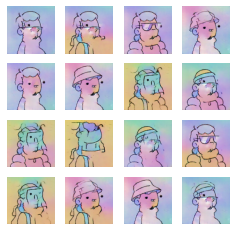

Epoch 376, generator_loss=9.916268348693848,discriminator_loss=0.3186301290988922, run_time=0:00:45.06


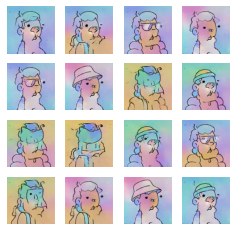

Epoch 377, generator_loss=9.730767250061035,discriminator_loss=0.31820857524871826, run_time=0:00:45.03


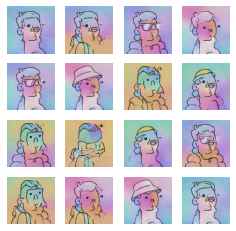

Epoch 378, generator_loss=9.44821834564209,discriminator_loss=0.31851279735565186, run_time=0:00:45.03


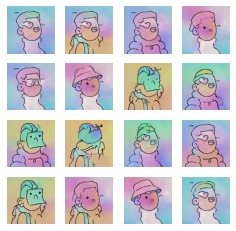

Epoch 379, generator_loss=9.29090690612793,discriminator_loss=0.3186567723751068, run_time=0:00:45.28


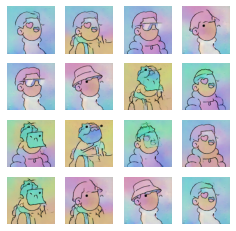

Epoch 380, generator_loss=9.626679420471191,discriminator_loss=0.3185124397277832, run_time=0:00:45.02


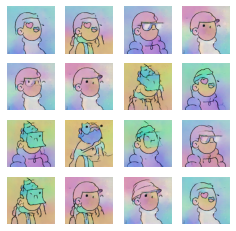

Epoch 381, generator_loss=9.84015941619873,discriminator_loss=0.31819063425064087, run_time=0:00:45.07


In [ ]:
# start/continue training
gan.train(train_dataset, startepoch, epochs, batch_size)

## Model Architecture Summary

### Generator Summary

In [9]:
GENERATOR = gan.GENERATOR
DISCRIMINATOR = gan.DISCRIMINATOR

GENERATOR.summary()

Model: "Generator128x128"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 4096)              413696    
                                                                 
 batch_normalization (BatchN  (None, 4096)             16384     
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 4096)              0         
                                                                 
 reshape (Reshape)           (None, 4, 4, 256)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 8, 8, 256)        1048832   
 nspose)                                                         
                                                                 
 batch_normalization_1 (Batc  (None, 8, 8, 256)   

### Discriminator Summary

In [10]:
DISCRIMINATOR.summary()

Model: "Discriminator128x128"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 128, 128, 64)      3136      
                                                                 
 batch_normalization_6 (Batc  (None, 128, 128, 64)     256       
 hNormalization)                                                 
                                                                 
 leaky_re_lu_6 (LeakyReLU)   (None, 128, 128, 64)      0         
                                                                 
 dropout (Dropout)           (None, 128, 128, 64)      0         
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 64, 64)        65600     
                                                                 
 batch_normalization_7 (Batc  (None, 64, 64, 64)       256       
 hNormalization)                              

### Generator Model Plot

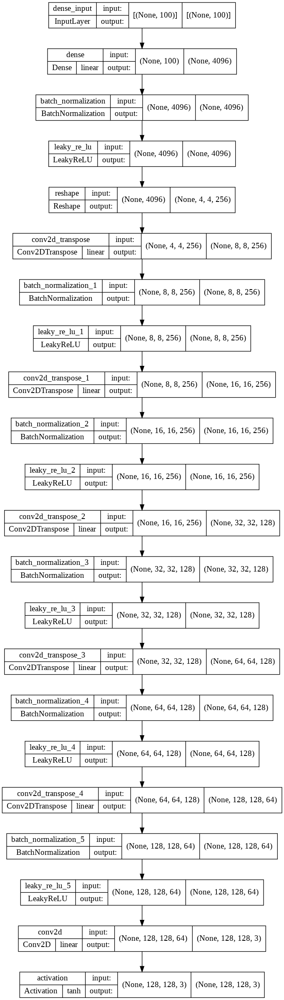

In [11]:
# plot the model
plotfile = outputpath + collection + '/generator_plot.png'
tf.keras.utils.plot_model(GENERATOR, to_file=plotfile, show_shapes=True, show_layer_names=True, show_layer_activations=True)

### Discriminator Model Plot

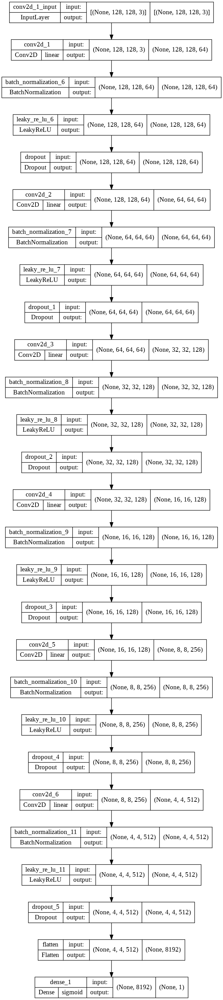

In [12]:
plotfile = outputpath + collection + '/discriminator_plot.png'
tf.keras.utils.plot_model(DISCRIMINATOR, to_file=plotfile, show_shapes=True, show_layer_names=True, show_layer_activations=True)

## Model Evaluation
##### Sample from the final generator
##### Loss Charts 
##### Inception Score (IS)
- Using the pre-trained Inception v3 model to classify the generated images. 
- The score has 2 criteria for the generated images:
  - quality: how much each image looks like a known class 
  - variety: how diverse the set represent different known classes.
- A higher inception score indicates better-quality generated images.

##### Frechet Inception Distance (FID)
- Same as the inception score, the FID score also uses the inception v3 model. 
- The score calculate the distance between real images and generated images using the Frechet distance.
- A lower FID score indicates more realistic images that match the statistical properties of real images.
- FID is consistent with human judgments and is more robust to noise than IS.

96124928/96112376 [==============================] - 0s 0us/step


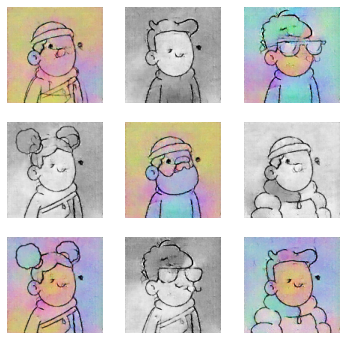

Collection: doodles  at epoch  150
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.003


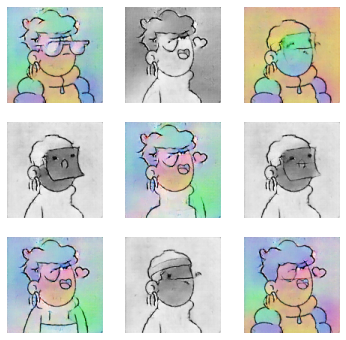

Collection: doodles  at epoch  165
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.003


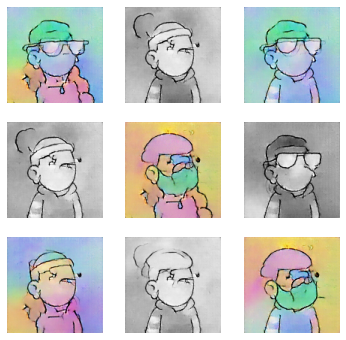

Collection: doodles  at epoch  180
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.003


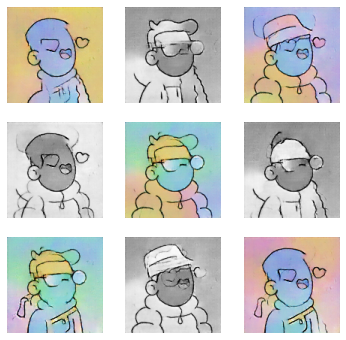

Collection: doodles  at epoch  195
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.001


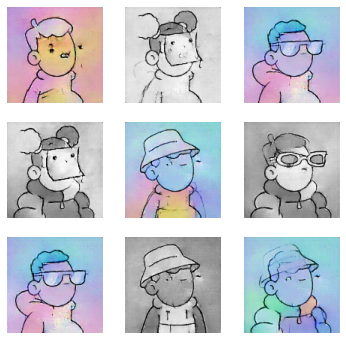

Collection: doodles  at epoch  210
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.002


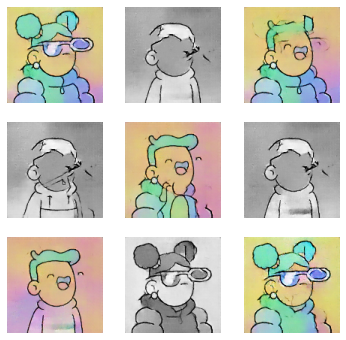

Collection: doodles  at epoch  225
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.002


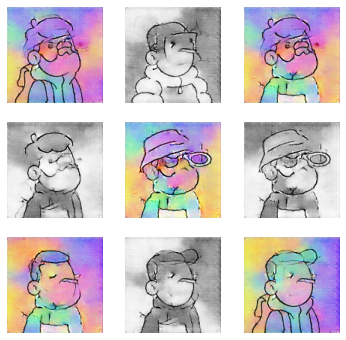

Collection: doodles  at epoch  240
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.003


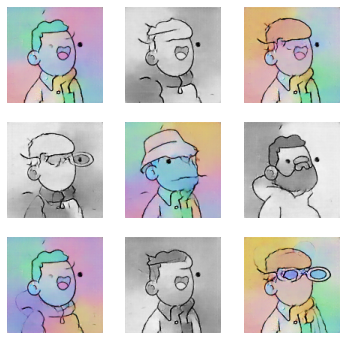

Collection: doodles  at epoch  255
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.002


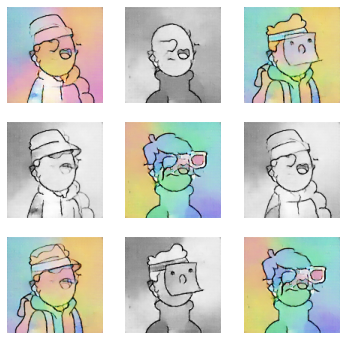

Collection: doodles  at epoch  270
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.003


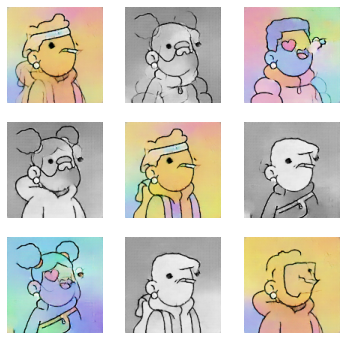

Collection: doodles  at epoch  285
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.002


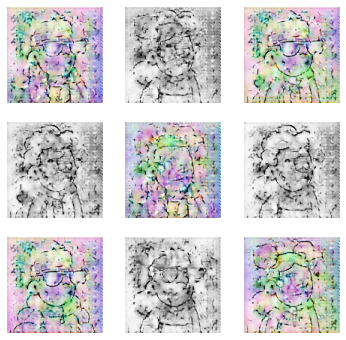

Collection: doodles  at epoch  300
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.012


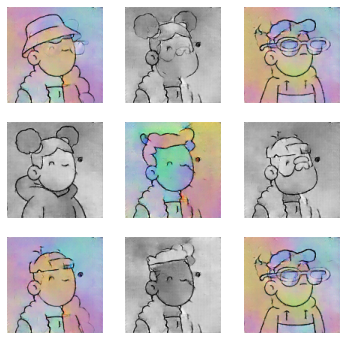

Collection: doodles  at epoch  315
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.006


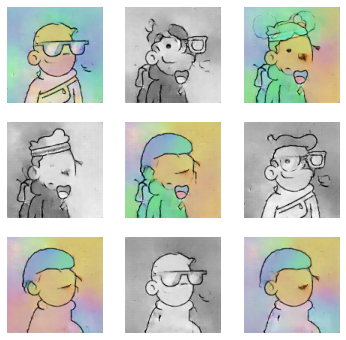

Collection: doodles  at epoch  330
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.003


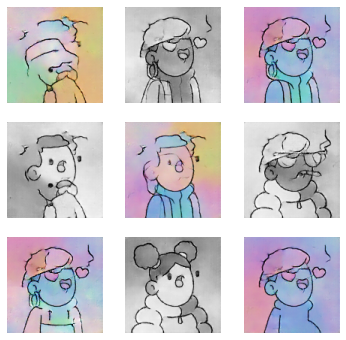

Collection: doodles  at epoch  345
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.002


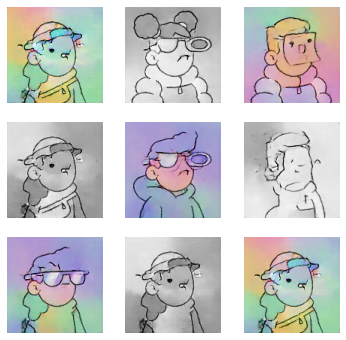

Collection: doodles  at epoch  360
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.003


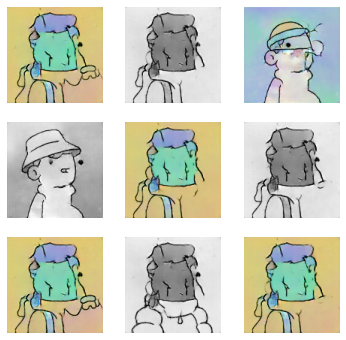

Collection: doodles  at epoch  375
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.006


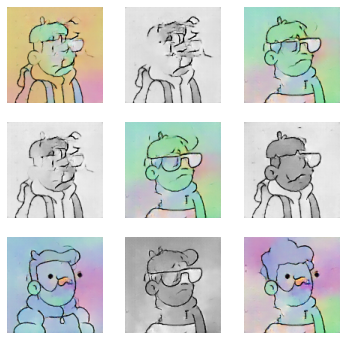

Collection: doodles  at epoch  390
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.003


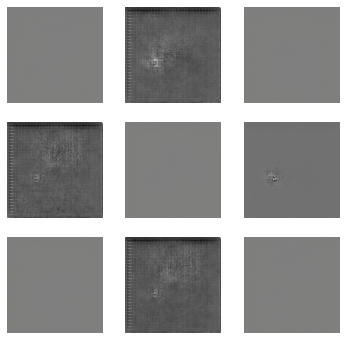

Collection: doodles  at epoch  405
IS score for original images 1.0  with std  0.0
IS score for generated images 1.0  with std  0.0
FID: 0.016


In [13]:
# evaluate each saved generators
# normally start after 100 epoch when generated images showing something
startepoch = 150
# endepoch is the total epochs
# endepoch = epochs
endepoch = 405
generator_epoch = range(startepoch,endepoch + 1,15)
# generator_epoch = [195,255,285,345, 390]

# Evaluations
ganeval = ganevaluation(collection, datapath, outputpath)

# manual evaluation of generated images as well as IS and FID scores
for epoch in generator_epoch:
  o_is_avg, o_is_std, g_is_avg, g_is_std, fid = ganeval.evaluate_epoch(epoch)
  print('Collection:', collection, ' at epoch ', epoch)
  print('IS score for original images', o_is_avg, ' with std ', o_is_std)
  print('IS score for generated images', g_is_avg, ' with std ', g_is_std)
  print('FID: %.3f' % fid)

# display training loss metrics, both batch and epoch level
# ganeval.loss_metrics_chart('batch')
# ganeval.loss_metrics_chart('epoch')

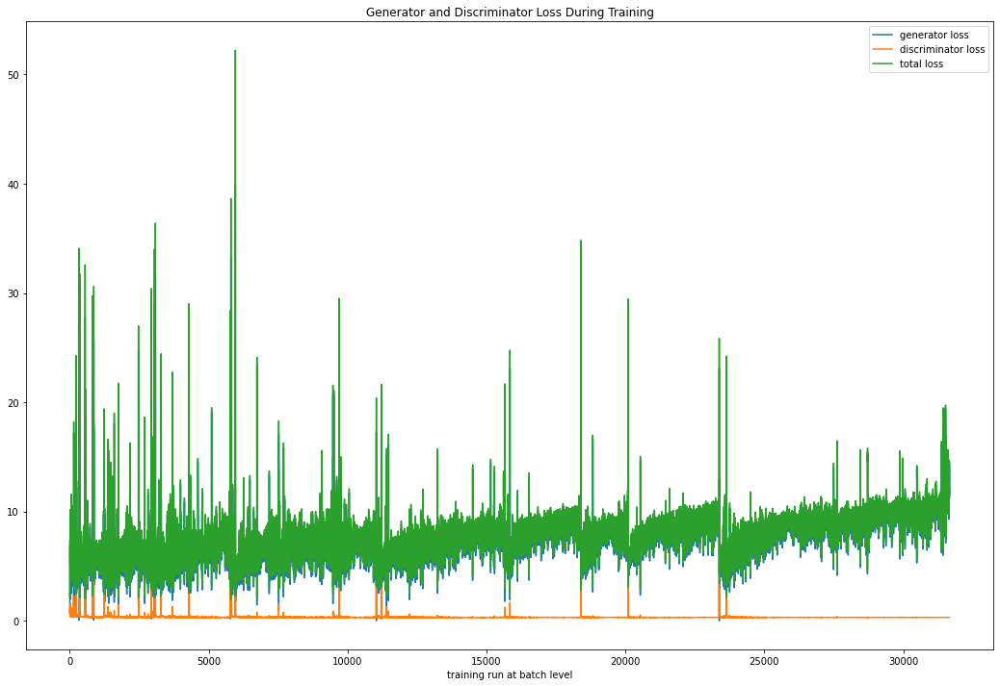

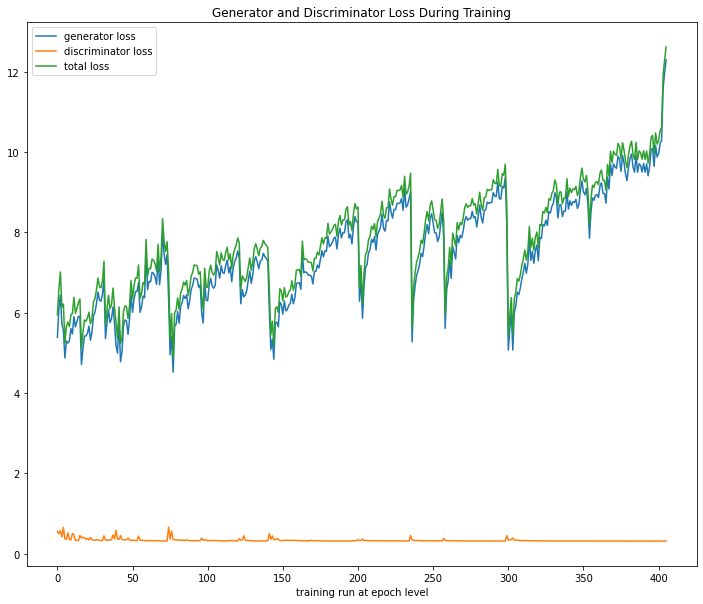

In [14]:
# display training loss metrics, both batch and epoch level
ganeval.loss_metrics_chart('batch')
ganeval.loss_metrics_chart('epoch')

## Best Practice and Challenges

#### Best Practice Followed

Model:
- Using Strided Convolutions for Downsample and Upsample instead of pooling
- Adding Gaussian Weight Initial noise to every layer of generator
- Using Batch Normalization
- Using LeakyReLU instead of ReLU, with a default slope of 0.2
- Using Dropout in descriminator (and generator?)
- use the tanh activation function to ensure generator output range [-1,1]

Optimizer:
- Using the Adam version of stochastic gradient descent (SGD) 
- Using Two Time-Scale Update Rule (TTUR): 
  - different learning rates for generator and discriminator
  - tuning learning rate, start with 0.0002
  - Using beta1 momentum of 0.5 instead of the default of 0.9

Training Process
- Scale/normalize images from [0,255] to the range [-1,1]
- Using Tanh as the last layer of the generator to output [-1,1]
- Train the discriminator with separate batches of real and fake images
- Using one-sided Label Smoothing to tune down discriminator to avoid overconfidence





#### Challenges

some of the well-known challenges:

- Non-convergence
  - No objective loss function for the GAN model overall performance    
    - The losses of Descriminator and Generator are measured individually
    - can't determine the relative/absolute GAN model quality from loss alone  
    - no way to objectively assess the progress of the training 
  - model is “good” when an equilibrium is reached between G and D 
    - typically when the discriminator’s loss is around 0.5
  - Training for a long time doesn’t always make the generator better, may worse
  - When D loss goes to 0, that's the failure mode
  - if loss of generator steadily decreases, then it's fooling D with garbage (says martin)  
  - Vanishing Gradients
  - 
- Mode collapse
  - generator produces the same or a small subset of the images repeatedly.
  
- Difficult to evaluate
  - In general no objective ways to evaluate the GAN performance
  - Subjective evaluation or manual inspection of generated images
  - Quantitative measures can be combined with qualitative assessment
    - the inception score
    - the Frechet inception distance

- Computing Environment
  - Colab(free): OOM at batch size 256
    - only when GPU available: batch size 128, run_time=0:02:22.20 per epoch
  - Colab pro: 
    - TPU: OOM at batch size 1024; batch size 512, run_time=0:30:27.46 per epoch
    - GPU: OOM at batch size 256;  batch size 128, run_time=0:01:31.42 per epoch